# U-Net with Pretrained MobileNetV2 as Encoder and decoder with attention mechanism

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importing Libraries and Functions

In [ ]:
import os
import numpy as np
import cv2
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from tensorflow.keras.layers import Conv2D, Activation, BatchNormalization
from tensorflow.keras.layers import UpSampling2D, Input, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras import backend as K
from tensorflow.keras import layers, models

In [ ]:
print("TensorFlow Version: ", tf.__version__)

TensorFlow Version:  2.14.0


Seeding

In [ ]:
np.random.seed(42)
tf.random.set_seed(42)

## Hyperparameters

In [ ]:
IMAGE_SIZE = 256
EPOCHS = 100
BATCH = 8
LR = 1e-4

PATH = "/content/drive/MyDrive/sub_dataset/U-net segmentation/Sub dataset_500"

In [ ]:
def load_data(path, split=0.1):
    images = sorted(glob(os.path.join(path, "leftImg/train/*")))
    masks = sorted(glob(os.path.join(path, "binary_mask/train/*")))

    total_size = len(images)
    valid_size = int(split * total_size)
    test_size = int(split * total_size)

    train_x, valid_x = train_test_split(images, test_size=valid_size, random_state=42)
    train_y, valid_y = train_test_split(masks, test_size=valid_size, random_state=42)

    train_x, test_x = train_test_split(train_x, test_size=test_size, random_state=42)
    train_y, test_y = train_test_split(train_y, test_size=test_size, random_state=42)

    return (train_x, train_y), (valid_x, valid_y), (test_x, test_y)

Reading the images and masks

In [ ]:
def read_image(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = x/255.0
    return x

def read_mask(path):
    path = path.decode()
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = x/255.0
    x = np.expand_dims(x, axis=-1)
    return x

Building the tf.data pipeline for training, validation and testing dataset.

In [ ]:
def tf_parse(x, y):
    def _parse(x, y):
        x = read_image(x)
        y = read_mask(y)
        return x, y

    x, y = tf.numpy_function(_parse, [x, y], [tf.float64, tf.float64])
    x.set_shape([IMAGE_SIZE, IMAGE_SIZE, 3])
    y.set_shape([IMAGE_SIZE, IMAGE_SIZE, 1])
    return x, y

def tf_dataset(x, y, batch=8):
    dataset = tf.data.Dataset.from_tensor_slices((x, y))
    dataset = dataset.map(tf_parse)
    dataset = dataset.batch(batch)
    dataset = dataset.repeat()
    return dataset

In [ ]:
(train_x, train_y), (valid_x, valid_y), (test_x, test_y) = load_data(PATH)

print("Training data: ", len(train_x))
print("Validation data: ", len(valid_x))
print("Testing data: ", len(test_x))

In [ ]:
def read_and_rgb(x):
    x = cv2.imread(x)
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    return x

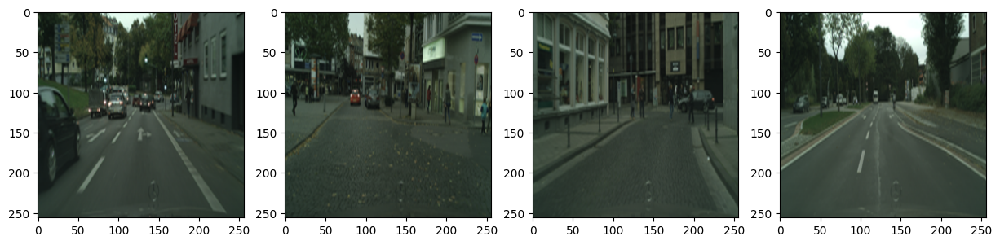

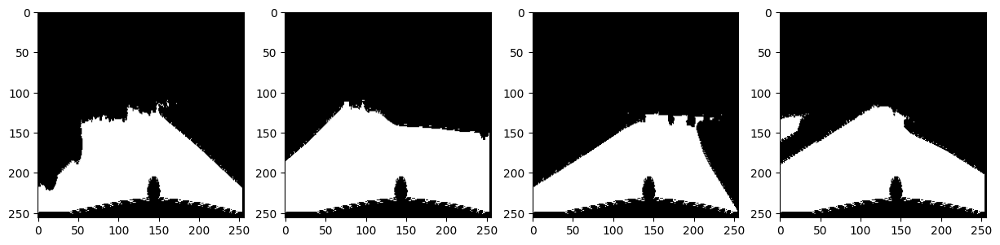

In [ ]:
fig = plt.figure(figsize=(15, 15))
a = fig.add_subplot(1, 4, 1)
imgplot = plt.imshow(read_and_rgb(train_x[0]))

a = fig.add_subplot(1, 4, 2)
imgplot = plt.imshow(read_and_rgb(train_x[1]))
imgplot.set_clim(0.0, 0.7)

a = fig.add_subplot(1, 4, 3)
imgplot = plt.imshow(read_and_rgb(train_x[2]))
imgplot.set_clim(0.0, 1.4)

a = fig.add_subplot(1, 4, 4)
imgplot = plt.imshow(read_and_rgb(train_x[3]))
imgplot.set_clim(0.0, 2.1)

fig = plt.figure(figsize=(15, 15))
a = fig.add_subplot(1, 4, 1)
imgplot = plt.imshow(read_and_rgb(train_y[0]))

a = fig.add_subplot(1, 4, 2)
imgplot = plt.imshow(read_and_rgb(train_y[1]))
imgplot.set_clim(0.0, 0.7)

a = fig.add_subplot(1, 4, 3)
imgplot = plt.imshow(read_and_rgb(train_y[2]))
imgplot.set_clim(0.0, 1.4)

a = fig.add_subplot(1, 4, 4)
imgplot = plt.imshow(read_and_rgb(train_y[3]))
imgplot.set_clim(0.0, 1.4)

## Model

In [ ]:
#ATTENTION MECHANISM
def attention_block(x, g, inter_channel):
    theta_x = layers.Conv2D(inter_channel, (1, 1), strides=(1, 1), padding='same')(x)
    phi_g = layers.Conv2D(inter_channel, (1, 1), strides=(4, 4), padding='same')(g)

    # Adjust spatial dimensions of phi_g to match x
    phi_g = layers.UpSampling2D(size=(2, 2))(phi_g)  # Upsample phi_g to match the spatial dimensions of x

    f = layers.Activation('relu')(layers.Add()([theta_x, phi_g]))
    psi_f = layers.Conv2D(1, (1, 1), strides=(1, 1), padding='same')(f)

    rate = layers.Activation('sigmoid')(psi_f)
    att_x = layers.Multiply()([x, rate])  # Apply element-wise multiplication with the input x

    return att_x


In [ ]:
def model_with_attention():
    inputs = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3), name="input_image")

    encoder = MobileNetV2(input_tensor=inputs, weights="imagenet", include_top=False, alpha=0.35)
    skip_connection_names = ["input_image", "block_1_expand_relu", "block_3_expand_relu", "block_6_expand_relu"]
    encoder_output = encoder.get_layer("block_13_expand_relu").output
    print(encoder_output.shape)

    f = [32, 64, 96, 120]
    # x = encoder_output
    # for i in range(1, len(skip_connection_names)+1, 1):

    att_x = encoder_output
    for i in range(1, len(skip_connection_names)+1, 1):
        x_skip = encoder.get_layer(skip_connection_names[-i]).output
        print(x_skip.shape)
        # x_skip = tf.reshape(x_skip,(-1,16,16,384))
        att_x = attention_block(att_x, x_skip, 192)  # Adjust the inter_channel value as needed

        att_x = UpSampling2D((2, 2))(att_x)
        att_x = Concatenate()([att_x, x_skip])

        att_x = Conv2D(f[-i], (3, 3), padding="same")(att_x)
        att_x = BatchNormalization()(att_x)
        att_x = Activation("relu")(att_x)

        att_x = Conv2D(f[-i], (3, 3), padding="same")(att_x)
        att_x = BatchNormalization()(att_x)
        att_x = Activation("relu")(att_x)

    att_x = Conv2D(1, (1, 1), padding="same")(att_x)
    att_x = Activation("sigmoid")(att_x)

    model_with_attention = Model(inputs, att_x)
    return model_with_attention

In [ ]:
# model = model()
# model.summary()
model_with_attention = model_with_attention()
model_with_attention.summary()

2019640/2019640 [==============================] - 0s 0us/step
(None, 16, 16, 192)
(None, 32, 32, 96)
(None, 64, 64, 48)
(None, 128, 128, 48)
(None, 256, 256, 3)
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 128, 128, 16)         432       ['input_image[0][0]']         
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 128, 128, 16)         64        ['Conv1[0][0]']               
 on)                                                                                              
                               

In [ ]:
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.7/993.7 kB 8.9 MB/s eta 0:00:00


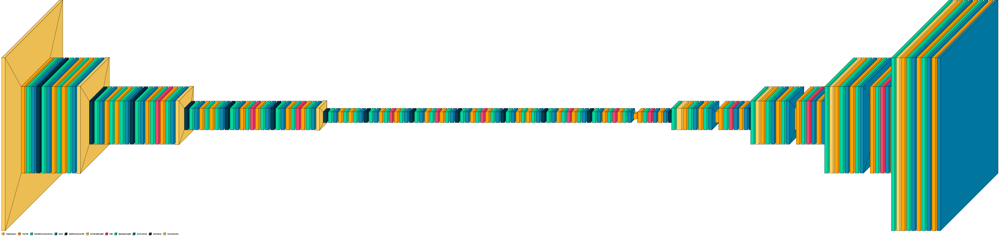

In [ ]:
import visualkeras
from PIL import ImageFont
from collections import defaultdict


color_map = defaultdict(dict)
color_map[layers.Conv2D]['fill'] = 'orange'
color_map[layers.MaxPooling2D]['fill'] = 'red'
color_map[layers.Dense]['fill'] = 'black'
color_map[layers.Flatten]['fill'] = 'teal'
visualkeras.layered_view(model_with_attention, legend=True,color_map=color_map)

##TENSORBOARD (to get .pbtxt file)

In [ ]:
# Load the TensorBoard notebook extension.
%load_ext tensorboard

In [ ]:
from datetime import datetime
from packaging import version

import tensorflow as tf
from tensorflow import keras

print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >= 2, \
    "This notebook requires TensorFlow 2.0 or above."

TensorFlow version:  2.14.0


In [ ]:
import tensorboard
tensorboard.__version__

'2.14.1'

In [ ]:
# Clear any logs from previous runs
!rm -rf ./logs/

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
def freeze_session(session, keep_var_names=None, output_names=None, clear_devices=True):
    """
    Freezes the state of a session into a pruned computation graph.

    Creates a new computation graph where variable nodes are replaced by
    constants taking their current value in the session. The new graph will be
    pruned so subgraphs that are not necessary to compute the requested
    outputs are removed.
    @param session The TensorFlow session to be frozen.
    @param keep_var_names A list of variable names that should not be frozen,
                          or None to freeze all the variables in the graph.
    @param output_names Names of the relevant graph outputs.
    @param clear_devices Remove the device directives from the graph for better portability.
    @return The frozen graph definition.
    """
    graph = session.graph
    with graph.as_default():
        freeze_var_names = list(set(v.name for v in tf.compat.v1.global_variables_initializer()).difference(keep_var_names or []))
        output_names = output_names or []
        output_names += [v.name for v in tf.compat.v1.global_variables_initializer()]
        input_graph_def = graph.as_graph_def()
        if clear_devices:
            for node in input_graph_def.node:
                node.device = ""
        frozen_graph = tf.graph_util.convert_variables_to_constants(
            session, input_graph_def, output_names, freeze_var_names)
        return frozen_graph

In [ ]:
from keras import backend as K
import tensorflow as tf


# Create, compile and train model...

frozen_graph = freeze_session(tf.compat.v1.keras.backend.get_session(),
                              output_names=[out.name for out in model_with_attention.outputs])

TypeError: ignored

In [ ]:
tf.compat.v1.train.write_graph(frozen_graph, "/content/", "model_502_with_att.pb", as_text=True)

NameError: ignored

## Metrics

In [ ]:
smooth = 1e-15
def dice_coef(y_true, y_pred):
    y_true = tf.keras.layers.Flatten()(y_true)
    y_pred = tf.keras.layers.Flatten()(y_pred)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

## Training

In [ ]:
train_dataset = tf_dataset(train_x, train_y, batch=BATCH)
valid_dataset = tf_dataset(valid_x, valid_y, batch=BATCH)

In [ ]:
opt = tf.keras.optimizers.Nadam(LR)
metrics = [dice_coef, Recall(), Precision()]
model_with_attention.compile(loss=dice_loss, optimizer=opt, metrics=metrics)

In [ ]:

log_dir = './result/'

callbacks = [
    ReduceLROnPlateau(monitor='vaoss', factor=0.1, patience=4),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=False)
]

In [ ]:
train_steps = len(train_x)//BATCH
valid_steps = len(valid_x)//BATCH

if len(train_x) % BATCH != 0:
    train_steps += 1
if len(valid_x) % BATCH != 0:
    valid_steps += 1

# model_with_attention.fit(
#     train_dataset,
#     validation_data=valid_dataset,
#     epochs=EPOCHS,
#     steps_per_epoch=train_steps,
#     validation_steps=valid_steps,
#     callbacks=callbacks
# )
history = model_with_attention.fit(
    train_dataset,
    validation_data=valid_dataset,
    epochs=EPOCHS,
    steps_per_epoch=train_steps,
    validation_steps=valid_steps,
    callbacks=callbacks
)
loss = history.history['loss']
val_loss = history.history['val_loss']


Epoch 1/100
50/50 [==============================] - ETA: 0s - loss: 0.2926 - dice_coef: 0.7074 - recall: 0.9459 - precision: 0.7686

50/50 [==============================] - 267s 5s/step - loss: 0.2926 - dice_coef: 0.7074 - recall: 0.9459 - precision: 0.7686 - val_loss: 0.4369 - val_dice_coef: 0.5398 - val_recall: 0.9781 - val_precision: 0.6294 - lr: 1.0000e-04
Epoch 2/100
50/50 [==============================] - ETA: 0s - loss: 0.1772 - dice_coef: 0.8228 - recall: 0.9678 - precision: 0.8858

50/50 [==============================] - 9s 187ms/step - loss: 0.1772 - dice_coef: 0.8228 - recall: 0.9678 - precision: 0.8858 - val_loss: 0.3869 - val_dice_coef: 0.5862 - val_recall: 0.9920 - val_precision: 0.5860 - lr: 1.0000e-04
Epoch 3/100
50/50 [==============================] - ETA: 0s - loss: 0.1531 - dice_coef: 0.8469 - recall: 0.9706 - precision: 0.9106

50/50 [==============================] - 10s 201ms/step - loss: 0.1531 - dice_coef: 0.8469 - recall: 0.9706 - precision: 0.9106 - val_loss: 0.3567 - val_dice_coef: 0.6147 - val_recall: 0.9911 - val_precision: 0.5848 - lr: 1.0000e-04
Epoch 4/100
50/50 [==============================] - ETA: 0s - loss: 0.1384 - dice_coef: 0.8616 - recall: 0.9721 - precision: 0.9246

50/50 [==============================] - 10s 210ms/step - loss: 0.1384 - dice_coef: 0.8616 - recall: 0.9721 - precision: 0.9246 - val_loss: 0.3057 - val_dice_coef: 0.6639 - val_recall: 0.9846 - val_precision: 0.6465 - lr: 1.0000e-04
Epoch 5/100
50/50 [==============================] - ETA: 0s - loss: 0.1270 - dice_coef: 0.8730 - recall: 0.9737 - precision: 0.9336

50/50 [==============================] - 9s 185ms/step - loss: 0.1270 - dice_coef: 0.8730 - recall: 0.9737 - precision: 0.9336 - val_loss: 0.2628 - val_dice_coef: 0.7049 - val_recall: 0.9735 - val_precision: 0.7064 - lr: 1.0000e-04
Epoch 6/100
50/50 [==============================] - ETA: 0s - loss: 0.1176 - dice_coef: 0.8824 - recall: 0.9749 - precision: 0.9402

50/50 [==============================] - 10s 200ms/step - loss: 0.1176 - dice_coef: 0.8824 - recall: 0.9749 - precision: 0.9402 - val_loss: 0.2408 - val_dice_coef: 0.7263 - val_recall: 0.9680 - val_precision: 0.7264 - lr: 1.0000e-04
Epoch 7/100
50/50 [==============================] - ETA: 0s - loss: 0.1093 - dice_coef: 0.8907 - recall: 0.9758 - precision: 0.9459

50/50 [==============================] - 10s 195ms/step - loss: 0.1093 - dice_coef: 0.8907 - recall: 0.9758 - precision: 0.9459 - val_loss: 0.2227 - val_dice_coef: 0.7439 - val_recall: 0.9620 - val_precision: 0.7464 - lr: 1.0000e-04
Epoch 8/100
50/50 [==============================] - ETA: 0s - loss: 0.1021 - dice_coef: 0.8979 - recall: 0.9762 - precision: 0.9508

50/50 [==============================] - 9s 187ms/step - loss: 0.1021 - dice_coef: 0.8979 - recall: 0.9762 - precision: 0.9508 - val_loss: 0.2046 - val_dice_coef: 0.7620 - val_recall: 0.9507 - val_precision: 0.7773 - lr: 1.0000e-04
Epoch 9/100
50/50 [==============================] - ETA: 0s - loss: 0.0954 - dice_coef: 0.9046 - recall: 0.9768 - precision: 0.9550

50/50 [==============================] - 10s 200ms/step - loss: 0.0954 - dice_coef: 0.9046 - recall: 0.9768 - precision: 0.9550 - val_loss: 0.1899 - val_dice_coef: 0.7764 - val_recall: 0.9458 - val_precision: 0.8008 - lr: 1.0000e-04
Epoch 10/100
50/50 [==============================] - ETA: 0s - loss: 0.0894 - dice_coef: 0.9106 - recall: 0.9771 - precision: 0.9589

50/50 [==============================] - 9s 190ms/step - loss: 0.0894 - dice_coef: 0.9106 - recall: 0.9771 - precision: 0.9589 - val_loss: 0.1876 - val_dice_coef: 0.7785 - val_recall: 0.9499 - val_precision: 0.7923 - lr: 1.0000e-04
Epoch 11/100
50/50 [==============================] - ETA: 0s - loss: 0.0839 - dice_coef: 0.9161 - recall: 0.9778 - precision: 0.9620

50/50 [==============================] - 10s 195ms/step - loss: 0.0839 - dice_coef: 0.9161 - recall: 0.9778 - precision: 0.9620 - val_loss: 0.1839 - val_dice_coef: 0.7823 - val_recall: 0.9397 - val_precision: 0.7988 - lr: 1.0000e-04
Epoch 12/100
50/50 [==============================] - ETA: 0s - loss: 0.0789 - dice_coef: 0.9211 - recall: 0.9783 - precision: 0.9650

50/50 [==============================] - 10s 202ms/step - loss: 0.0789 - dice_coef: 0.9211 - recall: 0.9783 - precision: 0.9650 - val_loss: 0.1712 - val_dice_coef: 0.7954 - val_recall: 0.9245 - val_precision: 0.8300 - lr: 1.0000e-04
Epoch 13/100
50/50 [==============================] - ETA: 0s - loss: 0.0743 - dice_coef: 0.9257 - recall: 0.9786 - precision: 0.9675

50/50 [==============================] - 10s 203ms/step - loss: 0.0743 - dice_coef: 0.9257 - recall: 0.9786 - precision: 0.9675 - val_loss: 0.1689 - val_dice_coef: 0.7981 - val_recall: 0.9240 - val_precision: 0.8284 - lr: 1.0000e-04
Epoch 14/100
50/50 [==============================] - ETA: 0s - loss: 0.0703 - dice_coef: 0.9297 - recall: 0.9788 - precision: 0.9696

50/50 [==============================] - 10s 194ms/step - loss: 0.0703 - dice_coef: 0.9297 - recall: 0.9788 - precision: 0.9696 - val_loss: 0.1692 - val_dice_coef: 0.7976 - val_recall: 0.9411 - val_precision: 0.8068 - lr: 1.0000e-04
Epoch 15/100
50/50 [==============================] - ETA: 0s - loss: 0.0665 - dice_coef: 0.9335 - recall: 0.9789 - precision: 0.9714

50/50 [==============================] - 10s 201ms/step - loss: 0.0665 - dice_coef: 0.9335 - recall: 0.9789 - precision: 0.9714 - val_loss: 0.1795 - val_dice_coef: 0.7874 - val_recall: 0.9450 - val_precision: 0.7792 - lr: 1.0000e-04
Epoch 16/100
50/50 [==============================] - ETA: 0s - loss: 0.0631 - dice_coef: 0.9369 - recall: 0.9791 - precision: 0.9730

50/50 [==============================] - 10s 199ms/step - loss: 0.0631 - dice_coef: 0.9369 - recall: 0.9791 - precision: 0.9730 - val_loss: 0.1722 - val_dice_coef: 0.7945 - val_recall: 0.9364 - val_precision: 0.7958 - lr: 1.0000e-04
Epoch 17/100
50/50 [==============================] - ETA: 0s - loss: 0.0600 - dice_coef: 0.9400 - recall: 0.9793 - precision: 0.9744

50/50 [==============================] - 10s 194ms/step - loss: 0.0600 - dice_coef: 0.9400 - recall: 0.9793 - precision: 0.9744 - val_loss: 0.1644 - val_dice_coef: 0.8021 - val_recall: 0.9326 - val_precision: 0.8093 - lr: 1.0000e-04
Epoch 18/100
50/50 [==============================] - ETA: 0s - loss: 0.0571 - dice_coef: 0.9429 - recall: 0.9793 - precision: 0.9757

50/50 [==============================] - 10s 201ms/step - loss: 0.0571 - dice_coef: 0.9429 - recall: 0.9793 - precision: 0.9757 - val_loss: 0.1682 - val_dice_coef: 0.7974 - val_recall: 0.9433 - val_precision: 0.7902 - lr: 1.0000e-04
Epoch 19/100
50/50 [==============================] - ETA: 0s - loss: 0.0546 - dice_coef: 0.9454 - recall: 0.9792 - precision: 0.9767

50/50 [==============================] - 9s 186ms/step - loss: 0.0546 - dice_coef: 0.9454 - recall: 0.9792 - precision: 0.9767 - val_loss: 0.1610 - val_dice_coef: 0.8130 - val_recall: 0.8669 - val_precision: 0.8690 - lr: 1.0000e-04
Epoch 20/100
50/50 [==============================] - ETA: 0s - loss: 0.0523 - dice_coef: 0.9477 - recall: 0.9791 - precision: 0.9777

50/50 [==============================] - 10s 201ms/step - loss: 0.0523 - dice_coef: 0.9477 - recall: 0.9791 - precision: 0.9777 - val_loss: 0.1584 - val_dice_coef: 0.8117 - val_recall: 0.9125 - val_precision: 0.8278 - lr: 1.0000e-04
Epoch 21/100
50/50 [==============================] - ETA: 0s - loss: 0.0502 - dice_coef: 0.9498 - recall: 0.9791 - precision: 0.9784

50/50 [==============================] - 10s 210ms/step - loss: 0.0502 - dice_coef: 0.9498 - recall: 0.9791 - precision: 0.9784 - val_loss: 0.1630 - val_dice_coef: 0.8089 - val_recall: 0.8875 - val_precision: 0.8379 - lr: 1.0000e-04
Epoch 22/100
50/50 [==============================] - ETA: 0s - loss: 0.0482 - dice_coef: 0.9518 - recall: 0.9789 - precision: 0.9794

50/50 [==============================] - 9s 185ms/step - loss: 0.0482 - dice_coef: 0.9518 - recall: 0.9789 - precision: 0.9794 - val_loss: 0.1635 - val_dice_coef: 0.8174 - val_recall: 0.8504 - val_precision: 0.8709 - lr: 1.0000e-04
Epoch 23/100
50/50 [==============================] - ETA: 0s - loss: 0.0460 - dice_coef: 0.9540 - recall: 0.9790 - precision: 0.9806

50/50 [==============================] - 10s 204ms/step - loss: 0.0460 - dice_coef: 0.9540 - recall: 0.9790 - precision: 0.9806 - val_loss: 0.1590 - val_dice_coef: 0.8161 - val_recall: 0.8746 - val_precision: 0.8537 - lr: 1.0000e-04
Epoch 24/100
50/50 [==============================] - ETA: 0s - loss: 0.0441 - dice_coef: 0.9559 - recall: 0.9791 - precision: 0.9816

50/50 [==============================] - 10s 211ms/step - loss: 0.0441 - dice_coef: 0.9559 - recall: 0.9791 - precision: 0.9816 - val_loss: 0.1528 - val_dice_coef: 0.8289 - val_recall: 0.8257 - val_precision: 0.9172 - lr: 1.0000e-04
Epoch 25/100
50/50 [==============================] - ETA: 0s - loss: 0.0424 - dice_coef: 0.9576 - recall: 0.9789 - precision: 0.9825

50/50 [==============================] - 9s 186ms/step - loss: 0.0424 - dice_coef: 0.9576 - recall: 0.9789 - precision: 0.9825 - val_loss: 0.1500 - val_dice_coef: 0.8280 - val_recall: 0.8544 - val_precision: 0.8880 - lr: 1.0000e-04
Epoch 26/100
50/50 [==============================] - ETA: 0s - loss: 0.0408 - dice_coef: 0.9592 - recall: 0.9790 - precision: 0.9832

50/50 [==============================] - 10s 201ms/step - loss: 0.0408 - dice_coef: 0.9592 - recall: 0.9790 - precision: 0.9832 - val_loss: 0.1578 - val_dice_coef: 0.8175 - val_recall: 0.8216 - val_precision: 0.9064 - lr: 1.0000e-04
Epoch 27/100
50/50 [==============================] - ETA: 0s - loss: 0.0392 - dice_coef: 0.9608 - recall: 0.9792 - precision: 0.9838

50/50 [==============================] - 10s 196ms/step - loss: 0.0392 - dice_coef: 0.9608 - recall: 0.9792 - precision: 0.9838 - val_loss: 0.1387 - val_dice_coef: 0.8358 - val_recall: 0.8780 - val_precision: 0.8835 - lr: 1.0000e-04
Epoch 28/100
50/50 [==============================] - ETA: 0s - loss: 0.0376 - dice_coef: 0.9624 - recall: 0.9795 - precision: 0.9845

50/50 [==============================] - 9s 190ms/step - loss: 0.0376 - dice_coef: 0.9624 - recall: 0.9795 - precision: 0.9845 - val_loss: 0.1401 - val_dice_coef: 0.8336 - val_recall: 0.9028 - val_precision: 0.8555 - lr: 1.0000e-04
Epoch 29/100
50/50 [==============================] - ETA: 0s - loss: 0.0364 - dice_coef: 0.9636 - recall: 0.9794 - precision: 0.9851

50/50 [==============================] - 10s 203ms/step - loss: 0.0364 - dice_coef: 0.9636 - recall: 0.9794 - precision: 0.9851 - val_loss: 0.1370 - val_dice_coef: 0.8342 - val_recall: 0.9132 - val_precision: 0.8506 - lr: 1.0000e-04
Epoch 30/100
50/50 [==============================] - ETA: 0s - loss: 0.0349 - dice_coef: 0.9651 - recall: 0.9797 - precision: 0.9858

50/50 [==============================] - 10s 195ms/step - loss: 0.0349 - dice_coef: 0.9651 - recall: 0.9797 - precision: 0.9858 - val_loss: 0.1336 - val_dice_coef: 0.8370 - val_recall: 0.9117 - val_precision: 0.8573 - lr: 1.0000e-04
Epoch 31/100
50/50 [==============================] - ETA: 0s - loss: 0.0337 - dice_coef: 0.9663 - recall: 0.9799 - precision: 0.9865

50/50 [==============================] - 10s 192ms/step - loss: 0.0337 - dice_coef: 0.9663 - recall: 0.9799 - precision: 0.9865 - val_loss: 0.1378 - val_dice_coef: 0.8377 - val_recall: 0.8910 - val_precision: 0.8664 - lr: 1.0000e-04
Epoch 32/100
50/50 [==============================] - ETA: 0s - loss: 0.0326 - dice_coef: 0.9674 - recall: 0.9799 - precision: 0.9869

50/50 [==============================] - 10s 202ms/step - loss: 0.0326 - dice_coef: 0.9674 - recall: 0.9799 - precision: 0.9869 - val_loss: 0.1305 - val_dice_coef: 0.8365 - val_recall: 0.9258 - val_precision: 0.8474 - lr: 1.0000e-04
Epoch 33/100
50/50 [==============================] - ETA: 0s - loss: 0.0315 - dice_coef: 0.9685 - recall: 0.9803 - precision: 0.9873

50/50 [==============================] - 10s 192ms/step - loss: 0.0315 - dice_coef: 0.9685 - recall: 0.9803 - precision: 0.9873 - val_loss: 0.1306 - val_dice_coef: 0.8401 - val_recall: 0.9030 - val_precision: 0.8665 - lr: 1.0000e-04
Epoch 34/100
50/50 [==============================] - ETA: 0s - loss: 0.0306 - dice_coef: 0.9694 - recall: 0.9802 - precision: 0.9876

50/50 [==============================] - 10s 197ms/step - loss: 0.0306 - dice_coef: 0.9694 - recall: 0.9802 - precision: 0.9876 - val_loss: 0.1246 - val_dice_coef: 0.8431 - val_recall: 0.9130 - val_precision: 0.8674 - lr: 1.0000e-04
Epoch 35/100
50/50 [==============================] - ETA: 0s - loss: 0.0300 - dice_coef: 0.9700 - recall: 0.9800 - precision: 0.9876

50/50 [==============================] - 10s 202ms/step - loss: 0.0300 - dice_coef: 0.9700 - recall: 0.9800 - precision: 0.9876 - val_loss: 0.1273 - val_dice_coef: 0.8435 - val_recall: 0.8927 - val_precision: 0.8805 - lr: 1.0000e-04
Epoch 36/100
50/50 [==============================] - ETA: 0s - loss: 0.0294 - dice_coef: 0.9706 - recall: 0.9798 - precision: 0.9876

50/50 [==============================] - 9s 185ms/step - loss: 0.0294 - dice_coef: 0.9706 - recall: 0.9798 - precision: 0.9876 - val_loss: 0.1206 - val_dice_coef: 0.8483 - val_recall: 0.9238 - val_precision: 0.8639 - lr: 1.0000e-04
Epoch 37/100
50/50 [==============================] - ETA: 0s - loss: 0.0288 - dice_coef: 0.9712 - recall: 0.9795 - precision: 0.9879

50/50 [==============================] - 10s 202ms/step - loss: 0.0288 - dice_coef: 0.9712 - recall: 0.9795 - precision: 0.9879 - val_loss: 0.1150 - val_dice_coef: 0.8581 - val_recall: 0.9100 - val_precision: 0.8878 - lr: 1.0000e-04
Epoch 38/100
50/50 [==============================] - ETA: 0s - loss: 0.0279 - dice_coef: 0.9721 - recall: 0.9797 - precision: 0.9884

50/50 [==============================] - 10s 208ms/step - loss: 0.0279 - dice_coef: 0.9721 - recall: 0.9797 - precision: 0.9884 - val_loss: 0.1106 - val_dice_coef: 0.8619 - val_recall: 0.8944 - val_precision: 0.9113 - lr: 1.0000e-04
Epoch 39/100
50/50 [==============================] - ETA: 0s - loss: 0.0271 - dice_coef: 0.9729 - recall: 0.9798 - precision: 0.9886

50/50 [==============================] - 9s 184ms/step - loss: 0.0271 - dice_coef: 0.9729 - recall: 0.9798 - precision: 0.9886 - val_loss: 0.1118 - val_dice_coef: 0.8628 - val_recall: 0.8922 - val_precision: 0.9098 - lr: 1.0000e-04
Epoch 40/100
50/50 [==============================] - ETA: 0s - loss: 0.0262 - dice_coef: 0.9738 - recall: 0.9800 - precision: 0.9891

50/50 [==============================] - 10s 200ms/step - loss: 0.0262 - dice_coef: 0.9738 - recall: 0.9800 - precision: 0.9891 - val_loss: 0.1121 - val_dice_coef: 0.8591 - val_recall: 0.9170 - val_precision: 0.8838 - lr: 1.0000e-04
Epoch 41/100
50/50 [==============================] - ETA: 0s - loss: 0.0255 - dice_coef: 0.9745 - recall: 0.9801 - precision: 0.9897

50/50 [==============================] - 10s 207ms/step - loss: 0.0255 - dice_coef: 0.9745 - recall: 0.9801 - precision: 0.9897 - val_loss: 0.1210 - val_dice_coef: 0.8516 - val_recall: 0.8997 - val_precision: 0.8811 - lr: 1.0000e-04
Epoch 42/100
50/50 [==============================] - ETA: 0s - loss: 0.0248 - dice_coef: 0.9752 - recall: 0.9803 - precision: 0.9899

50/50 [==============================] - 9s 183ms/step - loss: 0.0248 - dice_coef: 0.9752 - recall: 0.9803 - precision: 0.9899 - val_loss: 0.1080 - val_dice_coef: 0.8629 - val_recall: 0.9228 - val_precision: 0.8842 - lr: 1.0000e-04
Epoch 43/100
50/50 [==============================] - ETA: 0s - loss: 0.0242 - dice_coef: 0.9758 - recall: 0.9808 - precision: 0.9900

50/50 [==============================] - 10s 203ms/step - loss: 0.0242 - dice_coef: 0.9758 - recall: 0.9808 - precision: 0.9900 - val_loss: 0.1039 - val_dice_coef: 0.8658 - val_recall: 0.9210 - val_precision: 0.8936 - lr: 1.0000e-04
Epoch 44/100
50/50 [==============================] - ETA: 0s - loss: 0.0235 - dice_coef: 0.9765 - recall: 0.9816 - precision: 0.9899

50/50 [==============================] - 11s 221ms/step - loss: 0.0235 - dice_coef: 0.9765 - recall: 0.9816 - precision: 0.9899 - val_loss: 0.1127 - val_dice_coef: 0.8602 - val_recall: 0.9143 - val_precision: 0.8820 - lr: 1.0000e-04
Epoch 45/100
50/50 [==============================] - ETA: 0s - loss: 0.0229 - dice_coef: 0.9771 - recall: 0.9821 - precision: 0.9900

50/50 [==============================] - 9s 189ms/step - loss: 0.0229 - dice_coef: 0.9771 - recall: 0.9821 - precision: 0.9900 - val_loss: 0.1013 - val_dice_coef: 0.8674 - val_recall: 0.9314 - val_precision: 0.8879 - lr: 1.0000e-04
Epoch 46/100
50/50 [==============================] - ETA: 0s - loss: 0.0224 - dice_coef: 0.9776 - recall: 0.9826 - precision: 0.9900

50/50 [==============================] - 10s 203ms/step - loss: 0.0224 - dice_coef: 0.9776 - recall: 0.9826 - precision: 0.9900 - val_loss: 0.1073 - val_dice_coef: 0.8617 - val_recall: 0.9388 - val_precision: 0.8690 - lr: 1.0000e-04
Epoch 47/100
50/50 [==============================] - ETA: 0s - loss: 0.0220 - dice_coef: 0.9780 - recall: 0.9826 - precision: 0.9900

50/50 [==============================] - 10s 194ms/step - loss: 0.0220 - dice_coef: 0.9780 - recall: 0.9826 - precision: 0.9900 - val_loss: 0.1001 - val_dice_coef: 0.8665 - val_recall: 0.9536 - val_precision: 0.8696 - lr: 1.0000e-04
Epoch 48/100
50/50 [==============================] - ETA: 0s - loss: 0.0215 - dice_coef: 0.9785 - recall: 0.9830 - precision: 0.9899

50/50 [==============================] - 10s 191ms/step - loss: 0.0215 - dice_coef: 0.9785 - recall: 0.9830 - precision: 0.9899 - val_loss: 0.1037 - val_dice_coef: 0.8630 - val_recall: 0.9431 - val_precision: 0.8713 - lr: 1.0000e-04
Epoch 49/100
50/50 [==============================] - ETA: 0s - loss: 0.0210 - dice_coef: 0.9790 - recall: 0.9831 - precision: 0.9900

50/50 [==============================] - 10s 202ms/step - loss: 0.0210 - dice_coef: 0.9790 - recall: 0.9831 - precision: 0.9900 - val_loss: 0.1134 - val_dice_coef: 0.8534 - val_recall: 0.9476 - val_precision: 0.8490 - lr: 1.0000e-04
Epoch 50/100
50/50 [==============================] - ETA: 0s - loss: 0.0208 - dice_coef: 0.9792 - recall: 0.9831 - precision: 0.9899

50/50 [==============================] - 9s 189ms/step - loss: 0.0208 - dice_coef: 0.9792 - recall: 0.9831 - precision: 0.9899 - val_loss: 0.1202 - val_dice_coef: 0.8459 - val_recall: 0.9654 - val_precision: 0.8231 - lr: 1.0000e-04
Epoch 51/100
50/50 [==============================] - ETA: 0s - loss: 0.0206 - dice_coef: 0.9794 - recall: 0.9829 - precision: 0.9898

50/50 [==============================] - 10s 196ms/step - loss: 0.0206 - dice_coef: 0.9794 - recall: 0.9829 - precision: 0.9898 - val_loss: 0.1109 - val_dice_coef: 0.8549 - val_recall: 0.9517 - val_precision: 0.8499 - lr: 1.0000e-04
Epoch 52/100
50/50 [==============================] - ETA: 0s - loss: 0.0202 - dice_coef: 0.9798 - recall: 0.9829 - precision: 0.9900

50/50 [==============================] - 10s 200ms/step - loss: 0.0202 - dice_coef: 0.9798 - recall: 0.9829 - precision: 0.9900 - val_loss: 0.1068 - val_dice_coef: 0.8599 - val_recall: 0.9395 - val_precision: 0.8667 - lr: 1.0000e-04
Epoch 53/100
50/50 [==============================] - ETA: 0s - loss: 0.0201 - dice_coef: 0.9799 - recall: 0.9830 - precision: 0.9896

50/50 [==============================] - 10s 196ms/step - loss: 0.0201 - dice_coef: 0.9799 - recall: 0.9830 - precision: 0.9896 - val_loss: 0.1032 - val_dice_coef: 0.8657 - val_recall: 0.9206 - val_precision: 0.8895 - lr: 1.0000e-04
Epoch 54/100
50/50 [==============================] - ETA: 0s - loss: 0.0193 - dice_coef: 0.9807 - recall: 0.9837 - precision: 0.9902

50/50 [==============================] - 12s 235ms/step - loss: 0.0193 - dice_coef: 0.9807 - recall: 0.9837 - precision: 0.9902 - val_loss: 0.0814 - val_dice_coef: 0.8846 - val_recall: 0.9487 - val_precision: 0.9065 - lr: 1.0000e-04
Epoch 55/100
50/50 [==============================] - ETA: 0s - loss: 0.0187 - dice_coef: 0.9813 - recall: 0.9838 - precision: 0.9907

50/50 [==============================] - 11s 226ms/step - loss: 0.0187 - dice_coef: 0.9813 - recall: 0.9838 - precision: 0.9907 - val_loss: 0.0820 - val_dice_coef: 0.8856 - val_recall: 0.9235 - val_precision: 0.9293 - lr: 1.0000e-04
Epoch 56/100
50/50 [==============================] - ETA: 0s - loss: 0.0181 - dice_coef: 0.9819 - recall: 0.9842 - precision: 0.9911

50/50 [==============================] - 10s 192ms/step - loss: 0.0181 - dice_coef: 0.9819 - recall: 0.9842 - precision: 0.9911 - val_loss: 0.0782 - val_dice_coef: 0.8892 - val_recall: 0.9309 - val_precision: 0.9298 - lr: 1.0000e-04
Epoch 57/100
50/50 [==============================] - ETA: 0s - loss: 0.0178 - dice_coef: 0.9822 - recall: 0.9841 - precision: 0.9913

50/50 [==============================] - 10s 192ms/step - loss: 0.0178 - dice_coef: 0.9822 - recall: 0.9841 - precision: 0.9913 - val_loss: 0.0780 - val_dice_coef: 0.8887 - val_recall: 0.9483 - val_precision: 0.9131 - lr: 1.0000e-04
Epoch 58/100
50/50 [==============================] - ETA: 0s - loss: 0.0176 - dice_coef: 0.9824 - recall: 0.9842 - precision: 0.9914

50/50 [==============================] - 10s 198ms/step - loss: 0.0176 - dice_coef: 0.9824 - recall: 0.9842 - precision: 0.9914 - val_loss: 0.0816 - val_dice_coef: 0.8857 - val_recall: 0.9433 - val_precision: 0.9102 - lr: 1.0000e-04
Epoch 59/100
50/50 [==============================] - ETA: 0s - loss: 0.0174 - dice_coef: 0.9826 - recall: 0.9842 - precision: 0.9914

50/50 [==============================] - 9s 185ms/step - loss: 0.0174 - dice_coef: 0.9826 - recall: 0.9842 - precision: 0.9914 - val_loss: 0.0811 - val_dice_coef: 0.8851 - val_recall: 0.9595 - val_precision: 0.8964 - lr: 1.0000e-04
Epoch 60/100
50/50 [==============================] - ETA: 0s - loss: 0.0171 - dice_coef: 0.9829 - recall: 0.9843 - precision: 0.9915

50/50 [==============================] - 10s 200ms/step - loss: 0.0171 - dice_coef: 0.9829 - recall: 0.9843 - precision: 0.9915 - val_loss: 0.0841 - val_dice_coef: 0.8822 - val_recall: 0.9591 - val_precision: 0.8906 - lr: 1.0000e-04
Epoch 61/100
50/50 [==============================] - ETA: 0s - loss: 0.0169 - dice_coef: 0.9831 - recall: 0.9843 - precision: 0.9914

50/50 [==============================] - 11s 213ms/step - loss: 0.0169 - dice_coef: 0.9831 - recall: 0.9843 - precision: 0.9914 - val_loss: 0.0819 - val_dice_coef: 0.8844 - val_recall: 0.9517 - val_precision: 0.9008 - lr: 1.0000e-04
Epoch 62/100
50/50 [==============================] - ETA: 0s - loss: 0.0171 - dice_coef: 0.9829 - recall: 0.9840 - precision: 0.9909

50/50 [==============================] - 9s 184ms/step - loss: 0.0171 - dice_coef: 0.9829 - recall: 0.9840 - precision: 0.9909 - val_loss: 0.0839 - val_dice_coef: 0.8827 - val_recall: 0.9557 - val_precision: 0.8932 - lr: 1.0000e-04
Epoch 63/100
50/50 [==============================] - ETA: 0s - loss: 0.0172 - dice_coef: 0.9828 - recall: 0.9837 - precision: 0.9908

50/50 [==============================] - 10s 199ms/step - loss: 0.0172 - dice_coef: 0.9828 - recall: 0.9837 - precision: 0.9908 - val_loss: 0.0823 - val_dice_coef: 0.8842 - val_recall: 0.9594 - val_precision: 0.8935 - lr: 1.0000e-04
Epoch 64/100
50/50 [==============================] - ETA: 0s - loss: 0.0167 - dice_coef: 0.9833 - recall: 0.9840 - precision: 0.9910

50/50 [==============================] - 10s 206ms/step - loss: 0.0167 - dice_coef: 0.9833 - recall: 0.9840 - precision: 0.9910 - val_loss: 0.0842 - val_dice_coef: 0.8822 - val_recall: 0.9586 - val_precision: 0.8907 - lr: 1.0000e-04
Epoch 65/100
50/50 [==============================] - ETA: 0s - loss: 0.0166 - dice_coef: 0.9834 - recall: 0.9839 - precision: 0.9912

50/50 [==============================] - 9s 185ms/step - loss: 0.0166 - dice_coef: 0.9834 - recall: 0.9839 - precision: 0.9912 - val_loss: 0.0766 - val_dice_coef: 0.8894 - val_recall: 0.9658 - val_precision: 0.8981 - lr: 1.0000e-04
Epoch 66/100
50/50 [==============================] - ETA: 0s - loss: 0.0163 - dice_coef: 0.9837 - recall: 0.9841 - precision: 0.9913

50/50 [==============================] - 10s 199ms/step - loss: 0.0163 - dice_coef: 0.9837 - recall: 0.9841 - precision: 0.9913 - val_loss: 0.0741 - val_dice_coef: 0.8920 - val_recall: 0.9651 - val_precision: 0.9032 - lr: 1.0000e-04
Epoch 67/100
50/50 [==============================] - ETA: 0s - loss: 0.0158 - dice_coef: 0.9842 - recall: 0.9845 - precision: 0.9915

50/50 [==============================] - 10s 207ms/step - loss: 0.0158 - dice_coef: 0.9842 - recall: 0.9845 - precision: 0.9915 - val_loss: 0.0714 - val_dice_coef: 0.8947 - val_recall: 0.9637 - val_precision: 0.9090 - lr: 1.0000e-04
Epoch 68/100
50/50 [==============================] - ETA: 0s - loss: 0.0153 - dice_coef: 0.9847 - recall: 0.9851 - precision: 0.9918

50/50 [==============================] - 9s 186ms/step - loss: 0.0153 - dice_coef: 0.9847 - recall: 0.9851 - precision: 0.9918 - val_loss: 0.0685 - val_dice_coef: 0.8976 - val_recall: 0.9586 - val_precision: 0.9189 - lr: 1.0000e-04
Epoch 69/100
50/50 [==============================] - ETA: 0s - loss: 0.0151 - dice_coef: 0.9849 - recall: 0.9852 - precision: 0.9919

50/50 [==============================] - 10s 200ms/step - loss: 0.0151 - dice_coef: 0.9849 - recall: 0.9852 - precision: 0.9919 - val_loss: 0.0644 - val_dice_coef: 0.9015 - val_recall: 0.9529 - val_precision: 0.9319 - lr: 1.0000e-04
Epoch 70/100
50/50 [==============================] - ETA: 0s - loss: 0.0147 - dice_coef: 0.9853 - recall: 0.9856 - precision: 0.9920

50/50 [==============================] - 10s 193ms/step - loss: 0.0147 - dice_coef: 0.9853 - recall: 0.9856 - precision: 0.9920 - val_loss: 0.0659 - val_dice_coef: 0.8997 - val_recall: 0.9609 - val_precision: 0.9216 - lr: 1.0000e-04
Epoch 71/100
50/50 [==============================] - ETA: 0s - loss: 0.0145 - dice_coef: 0.9855 - recall: 0.9857 - precision: 0.9920

50/50 [==============================] - 10s 191ms/step - loss: 0.0145 - dice_coef: 0.9855 - recall: 0.9857 - precision: 0.9920 - val_loss: 0.0648 - val_dice_coef: 0.9010 - val_recall: 0.9594 - val_precision: 0.9247 - lr: 1.0000e-04
Epoch 72/100
50/50 [==============================] - ETA: 0s - loss: 0.0142 - dice_coef: 0.9858 - recall: 0.9859 - precision: 0.9923

50/50 [==============================] - 11s 230ms/step - loss: 0.0142 - dice_coef: 0.9858 - recall: 0.9859 - precision: 0.9923 - val_loss: 0.0637 - val_dice_coef: 0.9022 - val_recall: 0.9588 - val_precision: 0.9272 - lr: 1.0000e-04
Epoch 73/100
50/50 [==============================] - ETA: 0s - loss: 0.0138 - dice_coef: 0.9862 - recall: 0.9860 - precision: 0.9927

50/50 [==============================] - 10s 202ms/step - loss: 0.0138 - dice_coef: 0.9862 - recall: 0.9860 - precision: 0.9927 - val_loss: 0.0623 - val_dice_coef: 0.9033 - val_recall: 0.9656 - val_precision: 0.9238 - lr: 1.0000e-04
Epoch 74/100
50/50 [==============================] - ETA: 0s - loss: 0.0134 - dice_coef: 0.9866 - recall: 0.9862 - precision: 0.9931

50/50 [==============================] - 9s 190ms/step - loss: 0.0134 - dice_coef: 0.9866 - recall: 0.9862 - precision: 0.9931 - val_loss: 0.0624 - val_dice_coef: 0.9033 - val_recall: 0.9647 - val_precision: 0.9243 - lr: 1.0000e-04
Epoch 75/100
50/50 [==============================] - ETA: 0s - loss: 0.0131 - dice_coef: 0.9869 - recall: 0.9864 - precision: 0.9934

50/50 [==============================] - 10s 198ms/step - loss: 0.0131 - dice_coef: 0.9869 - recall: 0.9864 - precision: 0.9934 - val_loss: 0.0630 - val_dice_coef: 0.9028 - val_recall: 0.9673 - val_precision: 0.9204 - lr: 1.0000e-04
Epoch 76/100
50/50 [==============================] - ETA: 0s - loss: 0.0129 - dice_coef: 0.9871 - recall: 0.9866 - precision: 0.9935

50/50 [==============================] - 10s 201ms/step - loss: 0.0129 - dice_coef: 0.9871 - recall: 0.9866 - precision: 0.9935 - val_loss: 0.0631 - val_dice_coef: 0.9024 - val_recall: 0.9705 - val_precision: 0.9176 - lr: 1.0000e-04
Epoch 77/100
50/50 [==============================] - ETA: 0s - loss: 0.0127 - dice_coef: 0.9873 - recall: 0.9866 - precision: 0.9937

50/50 [==============================] - 10s 194ms/step - loss: 0.0127 - dice_coef: 0.9873 - recall: 0.9866 - precision: 0.9937 - val_loss: 0.0612 - val_dice_coef: 0.9042 - val_recall: 0.9714 - val_precision: 0.9202 - lr: 1.0000e-04
Epoch 78/100
50/50 [==============================] - ETA: 0s - loss: 0.0125 - dice_coef: 0.9875 - recall: 0.9868 - precision: 0.9938

50/50 [==============================] - 10s 199ms/step - loss: 0.0125 - dice_coef: 0.9875 - recall: 0.9868 - precision: 0.9938 - val_loss: 0.0622 - val_dice_coef: 0.9032 - val_recall: 0.9693 - val_precision: 0.9199 - lr: 1.0000e-04
Epoch 79/100
50/50 [==============================] - ETA: 0s - loss: 0.0122 - dice_coef: 0.9878 - recall: 0.9869 - precision: 0.9940

50/50 [==============================] - 9s 190ms/step - loss: 0.0122 - dice_coef: 0.9878 - recall: 0.9869 - precision: 0.9940 - val_loss: 0.0592 - val_dice_coef: 0.9060 - val_recall: 0.9673 - val_precision: 0.9270 - lr: 1.0000e-04
Epoch 80/100
50/50 [==============================] - ETA: 0s - loss: 0.0122 - dice_coef: 0.9878 - recall: 0.9869 - precision: 0.9939

50/50 [==============================] - 10s 196ms/step - loss: 0.0122 - dice_coef: 0.9878 - recall: 0.9869 - precision: 0.9939 - val_loss: 0.0623 - val_dice_coef: 0.9034 - val_recall: 0.9683 - val_precision: 0.9202 - lr: 1.0000e-04
Epoch 81/100
50/50 [==============================] - ETA: 0s - loss: 0.0123 - dice_coef: 0.9877 - recall: 0.9867 - precision: 0.9937

50/50 [==============================] - 11s 213ms/step - loss: 0.0123 - dice_coef: 0.9877 - recall: 0.9867 - precision: 0.9937 - val_loss: 0.0580 - val_dice_coef: 0.9073 - val_recall: 0.9642 - val_precision: 0.9317 - lr: 1.0000e-04
Epoch 82/100
50/50 [==============================] - ETA: 0s - loss: 0.0127 - dice_coef: 0.9873 - recall: 0.9864 - precision: 0.9931

50/50 [==============================] - 9s 184ms/step - loss: 0.0127 - dice_coef: 0.9873 - recall: 0.9864 - precision: 0.9931 - val_loss: 0.0603 - val_dice_coef: 0.9054 - val_recall: 0.9638 - val_precision: 0.9275 - lr: 1.0000e-04
Epoch 83/100
50/50 [==============================] - ETA: 0s - loss: 0.0127 - dice_coef: 0.9873 - recall: 0.9863 - precision: 0.9929

50/50 [==============================] - 10s 197ms/step - loss: 0.0127 - dice_coef: 0.9873 - recall: 0.9863 - precision: 0.9929 - val_loss: 0.0611 - val_dice_coef: 0.9044 - val_recall: 0.9622 - val_precision: 0.9274 - lr: 1.0000e-04
Epoch 84/100
50/50 [==============================] - ETA: 0s - loss: 0.0126 - dice_coef: 0.9874 - recall: 0.9864 - precision: 0.9929

50/50 [==============================] - 11s 211ms/step - loss: 0.0126 - dice_coef: 0.9874 - recall: 0.9864 - precision: 0.9929 - val_loss: 0.0595 - val_dice_coef: 0.9060 - val_recall: 0.9616 - val_precision: 0.9311 - lr: 1.0000e-04
Epoch 85/100
50/50 [==============================] - ETA: 0s - loss: 0.0122 - dice_coef: 0.9878 - recall: 0.9867 - precision: 0.9934

50/50 [==============================] - 9s 185ms/step - loss: 0.0122 - dice_coef: 0.9878 - recall: 0.9867 - precision: 0.9934 - val_loss: 0.0587 - val_dice_coef: 0.9068 - val_recall: 0.9590 - val_precision: 0.9346 - lr: 1.0000e-04
Epoch 86/100
50/50 [==============================] - ETA: 0s - loss: 0.0117 - dice_coef: 0.9883 - recall: 0.9871 - precision: 0.9938

50/50 [==============================] - 10s 202ms/step - loss: 0.0117 - dice_coef: 0.9883 - recall: 0.9871 - precision: 0.9938 - val_loss: 0.0603 - val_dice_coef: 0.9052 - val_recall: 0.9604 - val_precision: 0.9302 - lr: 1.0000e-04
Epoch 87/100
50/50 [==============================] - ETA: 0s - loss: 0.0115 - dice_coef: 0.9885 - recall: 0.9872 - precision: 0.9940

50/50 [==============================] - 10s 195ms/step - loss: 0.0115 - dice_coef: 0.9885 - recall: 0.9872 - precision: 0.9940 - val_loss: 0.0599 - val_dice_coef: 0.9056 - val_recall: 0.9675 - val_precision: 0.9245 - lr: 1.0000e-04
Epoch 88/100
50/50 [==============================] - ETA: 0s - loss: 0.0112 - dice_coef: 0.9888 - recall: 0.9874 - precision: 0.9943

50/50 [==============================] - 9s 188ms/step - loss: 0.0112 - dice_coef: 0.9888 - recall: 0.9874 - precision: 0.9943 - val_loss: 0.0579 - val_dice_coef: 0.9075 - val_recall: 0.9642 - val_precision: 0.9312 - lr: 1.0000e-04
Epoch 89/100
50/50 [==============================] - ETA: 0s - loss: 0.0110 - dice_coef: 0.9890 - recall: 0.9875 - precision: 0.9945

50/50 [==============================] - 10s 199ms/step - loss: 0.0110 - dice_coef: 0.9890 - recall: 0.9875 - precision: 0.9945 - val_loss: 0.0584 - val_dice_coef: 0.9071 - val_recall: 0.9623 - val_precision: 0.9316 - lr: 1.0000e-04
Epoch 90/100
50/50 [==============================] - ETA: 0s - loss: 0.0107 - dice_coef: 0.9893 - recall: 0.9877 - precision: 0.9947

50/50 [==============================] - 9s 190ms/step - loss: 0.0107 - dice_coef: 0.9893 - recall: 0.9877 - precision: 0.9947 - val_loss: 0.0577 - val_dice_coef: 0.9079 - val_recall: 0.9587 - val_precision: 0.9361 - lr: 1.0000e-04
Epoch 91/100
50/50 [==============================] - ETA: 0s - loss: 0.0107 - dice_coef: 0.9893 - recall: 0.9877 - precision: 0.9947

50/50 [==============================] - 10s 195ms/step - loss: 0.0107 - dice_coef: 0.9893 - recall: 0.9877 - precision: 0.9947 - val_loss: 0.0553 - val_dice_coef: 0.9101 - val_recall: 0.9649 - val_precision: 0.9352 - lr: 1.0000e-04
Epoch 92/100
50/50 [==============================] - ETA: 0s - loss: 0.0105 - dice_coef: 0.9895 - recall: 0.9879 - precision: 0.9947

50/50 [==============================] - 10s 197ms/step - loss: 0.0105 - dice_coef: 0.9895 - recall: 0.9879 - precision: 0.9947 - val_loss: 0.0571 - val_dice_coef: 0.9083 - val_recall: 0.9654 - val_precision: 0.9313 - lr: 1.0000e-04
Epoch 93/100
50/50 [==============================] - ETA: 0s - loss: 0.0105 - dice_coef: 0.9895 - recall: 0.9880 - precision: 0.9946

50/50 [==============================] - 9s 186ms/step - loss: 0.0105 - dice_coef: 0.9895 - recall: 0.9880 - precision: 0.9946 - val_loss: 0.0555 - val_dice_coef: 0.9101 - val_recall: 0.9642 - val_precision: 0.9357 - lr: 1.0000e-04
Epoch 94/100
50/50 [==============================] - ETA: 0s - loss: 0.0103 - dice_coef: 0.9897 - recall: 0.9881 - precision: 0.9947

50/50 [==============================] - 10s 197ms/step - loss: 0.0103 - dice_coef: 0.9897 - recall: 0.9881 - precision: 0.9947 - val_loss: 0.0567 - val_dice_coef: 0.9090 - val_recall: 0.9654 - val_precision: 0.9321 - lr: 1.0000e-04
Epoch 95/100
50/50 [==============================] - ETA: 0s - loss: 0.0102 - dice_coef: 0.9898 - recall: 0.9881 - precision: 0.9949

50/50 [==============================] - 10s 197ms/step - loss: 0.0102 - dice_coef: 0.9898 - recall: 0.9881 - precision: 0.9949 - val_loss: 0.0556 - val_dice_coef: 0.9101 - val_recall: 0.9663 - val_precision: 0.9330 - lr: 1.0000e-04
Epoch 96/100
50/50 [==============================] - ETA: 0s - loss: 0.0101 - dice_coef: 0.9899 - recall: 0.9882 - precision: 0.9949

50/50 [==============================] - 9s 183ms/step - loss: 0.0101 - dice_coef: 0.9899 - recall: 0.9882 - precision: 0.9949 - val_loss: 0.0522 - val_dice_coef: 0.9133 - val_recall: 0.9632 - val_precision: 0.9426 - lr: 1.0000e-04
Epoch 97/100
50/50 [==============================] - ETA: 0s - loss: 0.0101 - dice_coef: 0.9899 - recall: 0.9882 - precision: 0.9948

50/50 [==============================] - 10s 198ms/step - loss: 0.0101 - dice_coef: 0.9899 - recall: 0.9882 - precision: 0.9948 - val_loss: 0.0514 - val_dice_coef: 0.9142 - val_recall: 0.9599 - val_precision: 0.9468 - lr: 1.0000e-04
Epoch 98/100
50/50 [==============================] - ETA: 0s - loss: 0.0103 - dice_coef: 0.9897 - recall: 0.9880 - precision: 0.9944

50/50 [==============================] - 30s 605ms/step - loss: 0.0103 - dice_coef: 0.9897 - recall: 0.9880 - precision: 0.9944 - val_loss: 0.0526 - val_dice_coef: 0.9132 - val_recall: 0.9534 - val_precision: 0.9505 - lr: 1.0000e-04
Epoch 99/100
50/50 [==============================] - ETA: 0s - loss: 0.0103 - dice_coef: 0.9897 - recall: 0.9880 - precision: 0.9944

50/50 [==============================] - 10s 201ms/step - loss: 0.0103 - dice_coef: 0.9897 - recall: 0.9880 - precision: 0.9944 - val_loss: 0.0535 - val_dice_coef: 0.9122 - val_recall: 0.9548 - val_precision: 0.9475 - lr: 1.0000e-04
Epoch 100/100
50/50 [==============================] - ETA: 0s - loss: 0.0101 - dice_coef: 0.9899 - recall: 0.9880 - precision: 0.9947

50/50 [==============================] - 9s 187ms/step - loss: 0.0101 - dice_coef: 0.9899 - recall: 0.9880 - precision: 0.9947 - val_loss: 0.0517 - val_dice_coef: 0.9138 - val_recall: 0.9607 - val_precision: 0.9455 - lr: 1.0000e-04


##To use pretrained model run this cell

In [ ]:
from tensorflow.keras.models import load_model
path_to_model = '/content/model_0.00502.h5'
loaded_model = load_model(path_to_model, compile= False)

##PA, MPA, MIoU, Train and Val

7/7 [==============================] - 1s 123ms/step
Pixel Accuracy (PA): 97.22%
Mean Pixel Accuracy (MPA): 96.88%
Mean Intersection over Union (MIoU): 93.58%


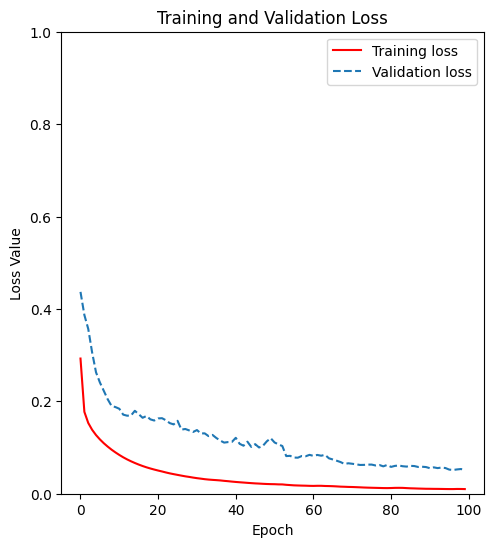

In [ ]:
# Define the class labels

N_CLASSES =2
class_labels = np.arange(N_CLASSES)

# Function to calculate PA, MPA, and MIoU
def calculate_metrics(y_true, y_pred):
    # Flatten the arrays
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()

    # Calculate confusion matrix
    conf_matrix = confusion_matrix(y_true_flat, y_pred_flat, labels=class_labels)

    # Calculate PA (Pixel Accuracy)
    pa = np.trace(conf_matrix) / np.sum(conf_matrix)

    # Calculate MPA (Mean Pixel Accuracy)
    mpa = np.mean(np.diag(conf_matrix) / np.sum(conf_matrix, axis=1))

    # Calculate MIoU (Mean Intersection over Union)
    intersection = np.diag(conf_matrix)
    union = np.sum(conf_matrix, axis=1) + np.sum(conf_matrix, axis=0) - np.diag(conf_matrix)
    miou = np.mean(intersection / union)

    return pa, mpa, miou

# Evaluate on the validation dataset


val_predictions = model_with_attention.predict(valid_dataset, steps=valid_steps)
#val_predictions = loaded_model.predict(valid_dataset, steps=valid_steps)


val_predictions = (val_predictions > 0.5).astype(np.int32)  # Assuming binary segmentation

# Assuming you have ground truth labels in valid_y, adjust accordingly
val_labels = np.concatenate([y.numpy() for _, y in valid_dataset.take(valid_steps)])

# Calculate metrics
pa, mpa, miou = calculate_metrics(val_labels, val_predictions)
print(f'Pixel Accuracy (PA): {pa * 100:.2f}%')
print(f'Mean Pixel Accuracy (MPA): {mpa * 100:.2f}%')
print(f'Mean Intersection over Union (MIoU): {miou * 100:.2f}%')

# Plot training and validation loss
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.plot(history.epoch, loss, 'r', label='Training loss')
plt.plot(history.epoch, val_loss, '--', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss Value')
plt.ylim([0, 1])
plt.legend()

plt.show()

##Save the trained model. Don't if you are using .h5 (weights of training)

In [ ]:
model_with_attention.save('model_0.00502.h5')

##EVALUATION: Load Saved Model

In [ ]:
test_dataset = tf_dataset(test_x, test_y, batch=BATCH)

test_steps = (len(test_x)//BATCH)
if len(test_x) % BATCH != 0:
    test_steps += 1

model_with_attention.evaluate(test_dataset, steps=test_steps)
#loaded_model.evaluate(test_dataset, steps=test_steps)

7/7 [==============================] - 37s 5s/step - loss: 0.0394 - dice_coef: 0.9611 - recall: 0.9648 - precision: 0.9592


[0.03943978250026703,
 0.9611079096794128,
 0.9647743105888367,
 0.959221363067627]

## Results

In [ ]:
def read_image(path):
    x = cv2.imread(path, cv2.IMREAD_COLOR)
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = x/255.0
    return x

def read_mask(path):
    x = cv2.imread(path, cv2.IMREAD_GRAYSCALE)
    x = cv2.resize(x, (IMAGE_SIZE, IMAGE_SIZE))
    x = np.expand_dims(x, axis=-1)
    x = x/255.0
    return x

In [ ]:
def mask_parse(mask):
    mask = np.squeeze(mask)
    mask = [mask, mask, mask]
    mask = np.transpose(mask, (1, 2, 0))
    return mask


Classes to detect, with corresponding colors:


<ipython-input-39-2d50dd390f10>:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_ref = cm.get_cmap('Set1', 12)


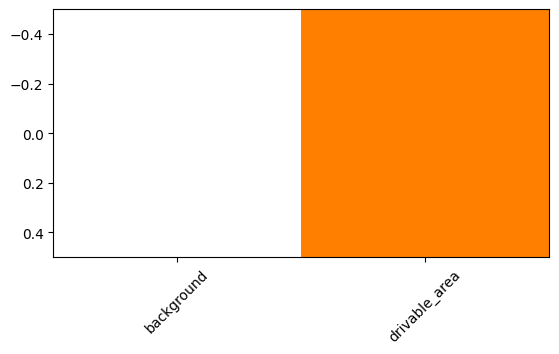

In [ ]:
import sys
import cv2
import helpers
from helpers import *
%matplotlib inline
from matplotlib.colors import ListedColormap
from matplotlib import cm
from matplotlib import gridspec
from matplotlib import pyplot as plt
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

from tensorflow.keras.layers import Conv2D, Activation, BatchNormalization
from tensorflow.keras.layers import UpSampling2D, Input, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Recall, Precision
from tensorflow.keras import backend as K
from tensorflow.keras import layers, models
cmap_ref = cm.get_cmap('Set1', 12)
cmap_seg = np.zeros((6, 4))
cmap_seg[0] = [0.7, 0.7, 0.7, 0]
for i in range(1, 6):
  cmap_seg[i] = cmap_ref(i)

cmap_seg = ListedColormap(cmap_seg)
print("\nClasses to detect, with corresponding colors:")
plt.imshow([[0, 1]], cmap=cmap_seg)
plt.xticks([0,1], LABEL_NAMES[[0,1]], rotation=45)

INPUT_SPATIAL = 224

In [ ]:
from matplotlib.colors import ListedColormap
from matplotlib import cm

cmap_ref = cm.get_cmap('Set1', 12)
cmap_seg = np.zeros((6, 4))
cmap_seg[0] = [0.7, 0.7, 0.7, 0]
for i in range(1, 6):
  cmap_seg[i] = cmap_ref(i)

cmap_seg = ListedColormap(cmap_seg)

<ipython-input-40-7a5c41482a76>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_ref = cm.get_cmap('Set1', 12)


1/1 [==============================] - 0s 35ms/step


<ipython-input-43-d897fcc6511c>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(12, 12))


1/1 [==============================] - 0s 23ms/step


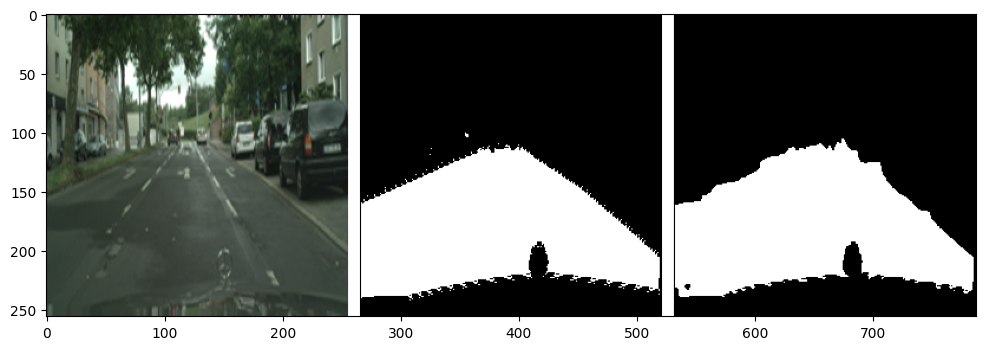

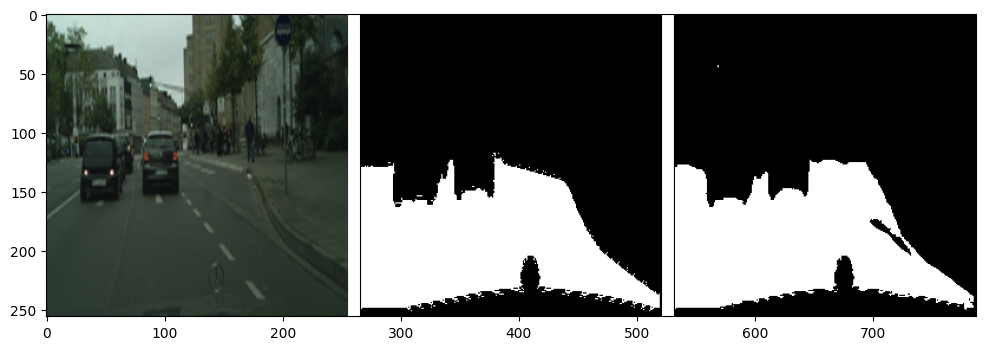

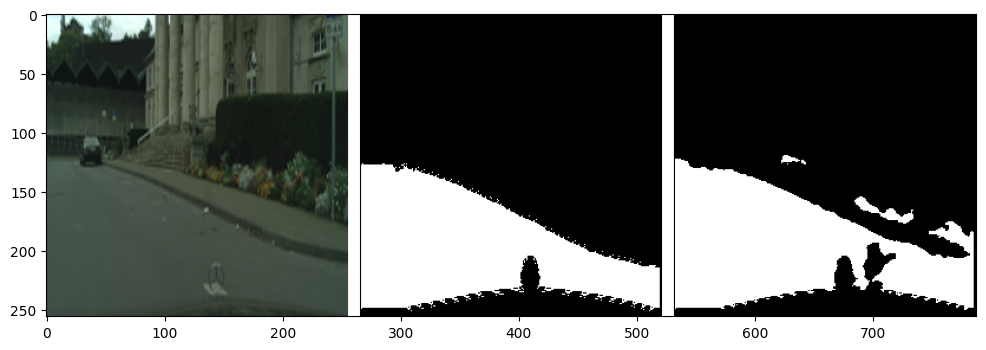

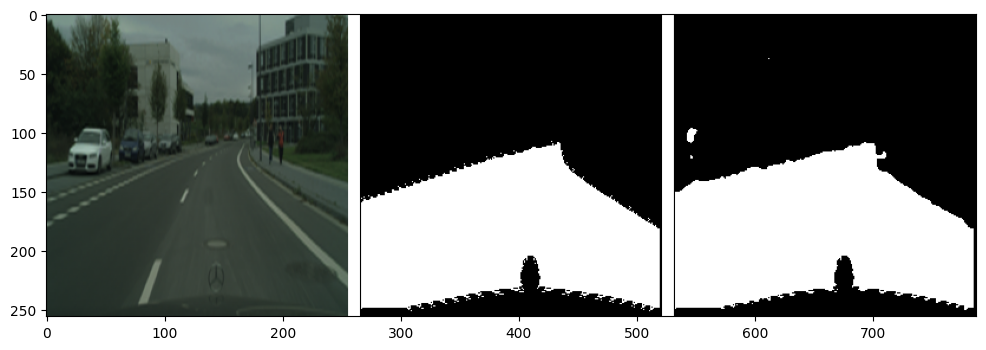

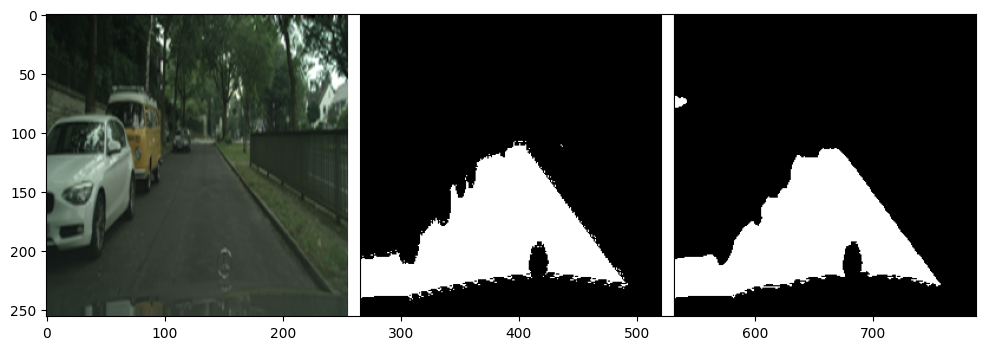

...

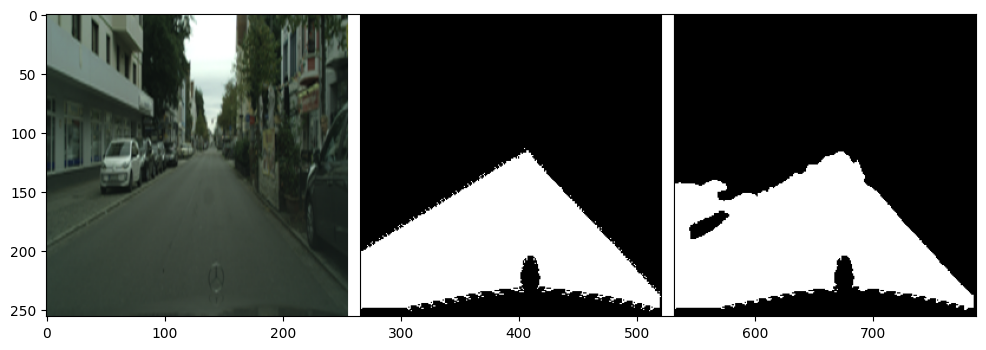

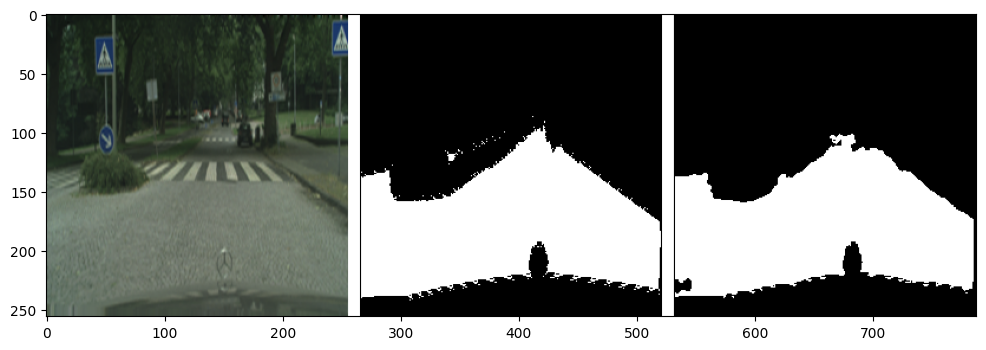

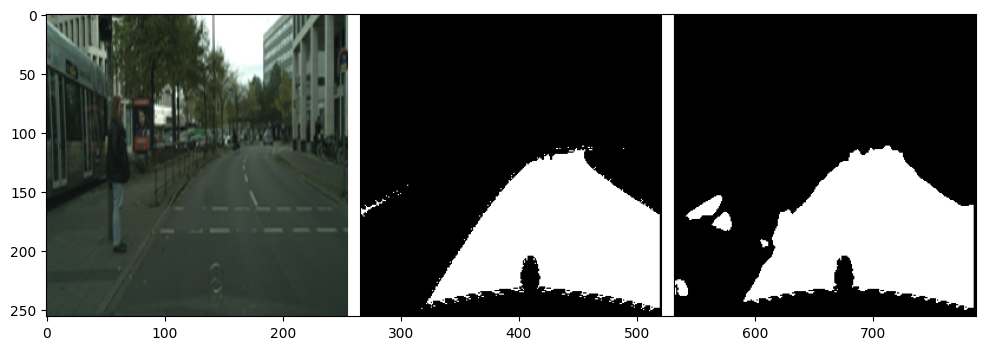

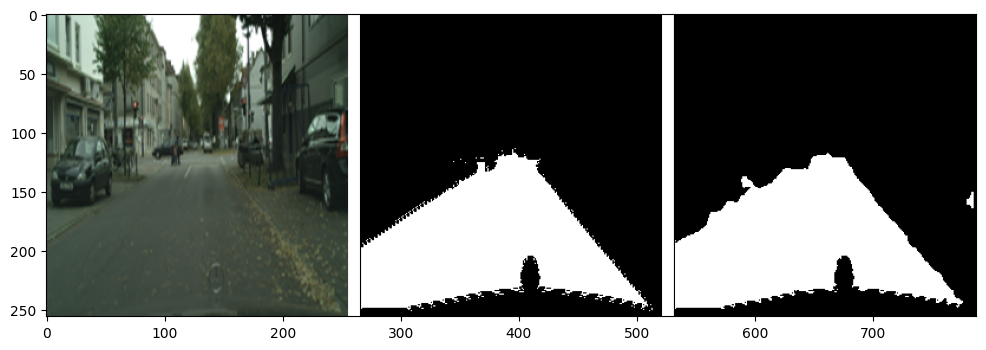

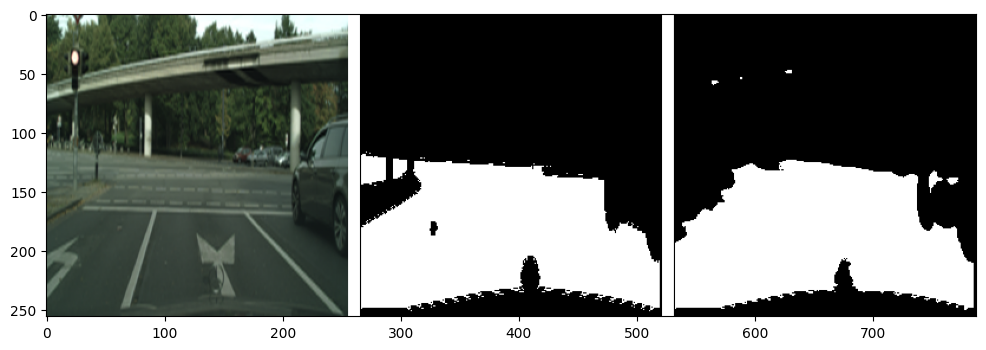

In [ ]:
for i, (x, y) in enumerate(zip(test_x, test_y)):
    x = read_image(x)
    y = read_mask(y)

    y_pred = model_with_attention.predict(np.expand_dims(x, axis=0))[0] > 0.5
    #y_pred = loaded_model.predict(np.expand_dims(x, axis=0))[0] > 0.5

    h, w, _ = x.shape
    white_line = np.ones((h, 10, 3))

    all_images = [
        x, white_line,
        mask_parse(y), white_line,
        mask_parse(y_pred)
    ]
    image = np.concatenate(all_images, axis=1)

    fig = plt.figure(figsize=(12, 12))
    a = fig.add_subplot(1, 1, 1)
    imgplot = plt.imshow(image)